 # <center> Checkerboard Data Analysis </center>

        This notebook is the second one of the Analysis Pipeline. If you haven't run the first one (Preprocessing) until the extraction of phy's data , you don't have the files needed to run this one. In this notebook, you will use phy sorted cluster spikes of a checkerboard recording to compute clusters raster plots, ganglion cells STA and fit ellipses on their receptive fields.
        You will 
       

In [1]:
%load_ext autoreload
%autoreload 2

import os
import params
from utils import *
import numpy as np
import matplotlib.pyplot as plt
import math
from matplotlib.gridspec import GridSpec
from PIL import Image

### Cell 1: Load data

Loading all data. mendatory for each run !

In [2]:
"""
    Variables
    
    DO NOT CHANGE VALUES HERE UNLESS DEBUG/SPECIFIC USE
    
    All the variables used in this part of the cell should always refere to your 'params.py' file
    unless you want to manually change them only for this run (i.e. debugging). 
    You may have to add those variable into the function you want to adapt as only the minimal 
    amount of var are currently given to functions as inputs.
"""

#Link to the actual raw files from the recording listed in the input_file
recording_directory     = params.recording_directory

# Directory where preprocessing info are saved
output_directory        = params.output_directory

#folder in which the triggers are saved
triggers_directory      = params.triggers_directory

#name of your experiment for saving the triggers
exp                     = params.exp

#Number of frames in each checkerboard sequence
nb_frames_by_sequence   = params.nb_frames_by_sequence

#Recordings labels available
recording_names = params.recording_names

#Sampling frequency of the MEA
fs = params.fs



"""
    Inputs
"""

#Getting right recording name
print('Which of the following is the checkerboard : ')
for num, rec in enumerate(recording_names):
    print(f'\t{num} --> {rec}')
recording_number = int(input('Checkerboard number : '))
checkerboard_name = recording_names[recording_number]
print('Selected recording: {}\n'.format(checkerboard_name))

#Frequency at which your stim has been played
stimulus_frequency = int(input("Select stimulus Frequency (usually 30Hz) : ")) # Change the frequency

#Nb of checks used on the checkerboard
nb_checks_x = int(input("Select number of checks on x (usually 40 for fine checkerboard) : "))   ##### Here change the number of checks if necessary
nb_checks_y = int(input("Select number of checks on y (usually 40 for fine checkerboard) : "))   ##### Here change the number of checks if necessary

check_directory = os.path.normpath(os.path.join(output_directory,r'Checkerboard_Analysis_rec_{}'.format(recording_number)))
if not os.path.isdir(check_directory): os.makedirs(check_directory)



"""
    Processing
"""

#Checkerboard file where triggers were recorded
triggers_file = os.path.normpath(os.path.join(triggers_directory,r"{}_{}_triggers.pkl".format(exp,checkerboard_name)))
triggers_data = load_obj(triggers_file)

#File where the spikes of all the recordings of the experiment are saved
neurons_file  = os.path.normpath(os.path.join(output_directory,r'{}_fullexp_neurons_data.pkl'.format(exp)))
all_recs_spikes = load_obj(neurons_file)


#keep only the spikes recorded during checkerboard
checkerboard_spikes = get_recording_spikes(checkerboard_name, all_recs_spikes)
cells_id = list(checkerboard_spikes.keys())
triggers = triggers_data['indices']/fs
nb_repeats = int(len(triggers)/nb_frames_by_sequence)
duration_sequence = int(nb_frames_by_sequence/stimulus_frequency)


print("\nCheckerboard Stats :\n\t- {} min total duration \n\t- {} triggers \n\t- {} complete sequences\n\t- {} seconds per sequence\n".format(
      int(triggers_data['duration']/fs/60),len(triggers),
      nb_repeats, duration_sequence))


nb_frames = int((nb_repeats)*int(nb_frames_by_sequence/2))
stimulus_path = os.path.normpath(os.path.join(check_directory, "checkerboard_{}x{}checks_{}frames.npy".format(nb_checks_x,nb_checks_y,nb_frames)))

if os.path.isfile(stimulus_path):
    print("Stimulus file exists. Loaded from :\t {}".format(stimulus_path))
    checkerboard = np.load(stimulus_path)
else:
    print("Reconstructing the stimulus...")
    checkerboard = checkerboard_from_binary(nb_frames, nb_checks_x, nb_checks_y, checkerboard_file = stimulus_path, binary_source_path=params.binary_source_path)

print('Total : {} neurons loaded \n\nClusters id :\n{}\n'.format(len(checkerboard_spikes.keys()),cells_id))


Which of the following is the checkerboard : 
	0 --> 00_Checkerboard_30ND50%_20pix30checks_30Hz
	1 --> 01_Checkerboard_30ND50%_16pix40checks_30Hz
	2 --> 02_DG_30ND50%_2sT_50Hz
	3 --> 03_Chirp_20reps_30ND50%_50Hz
	4 --> 04_Flicker_BeforeDrugs_30ND10%_1Hz
	5 --> 05_VDH_FF+Disk_GreyLevel_100µm_20reps_N8_Z(-25)_25ND50%_40Hz
	6 --> 06_VDH_FF+Disk_FullContrast_100µm(dark)_5reps_N8_Z(-30)_25ND50%_40Hz
	7 --> 07_VDH_FF_70reps_N8_Z(-30)_30ND50%_40Hz
	8 --> 08_Flicker_LAP4+ACET_t+10_30ND10%_1Hz
	9 --> 09_VDH_LAP4+ACET_FF+Disk_FullContrast_100µm(dark)_5reps_N8
	10 --> 10_HoloStim1_LAP4+ACET_N19_Z(-25)
	11 --> 11_OptoStim1_LAP4+ACET_15ND50%_1Hz
	12 --> 12_OptoStim1_LAP4+ACET_5ND50%_1Hz
	13 --> 13_OptoStim2_TPMPA_t10_5ND50%_1Hz
	14 --> 14_OptoStim2_TPMPA_t30_5ND50%_1Hz
	15 --> 15_HoloStim2_TPMPA_t30_N19_Z(-25)
	16 --> 16_OptoStim3_18BG(10uM)_t0-10_5ND50%_1Hz
	17 --> 17_HoloStim3_18BG(10uM)_t10_N19_Z(-25)
	18 --> 18_OptoStim4_18BG(20uM)_t0-10_5ND50%_1Hz
	19 --> 19_HoloStim4_18BG(20uM)_t10_N19_Z(-25)

### Cell 2 : Plot Raster plots and PSTH

Analysis on repeated sequence

#### <center><i>REQUIRES CELL 1 RUN</center>

Building rasters...


  0%|          | 0/212 [00:00<?, ?it/s]

Ploting...


  0%|          | 0/225 [00:00<?, ?it/s]

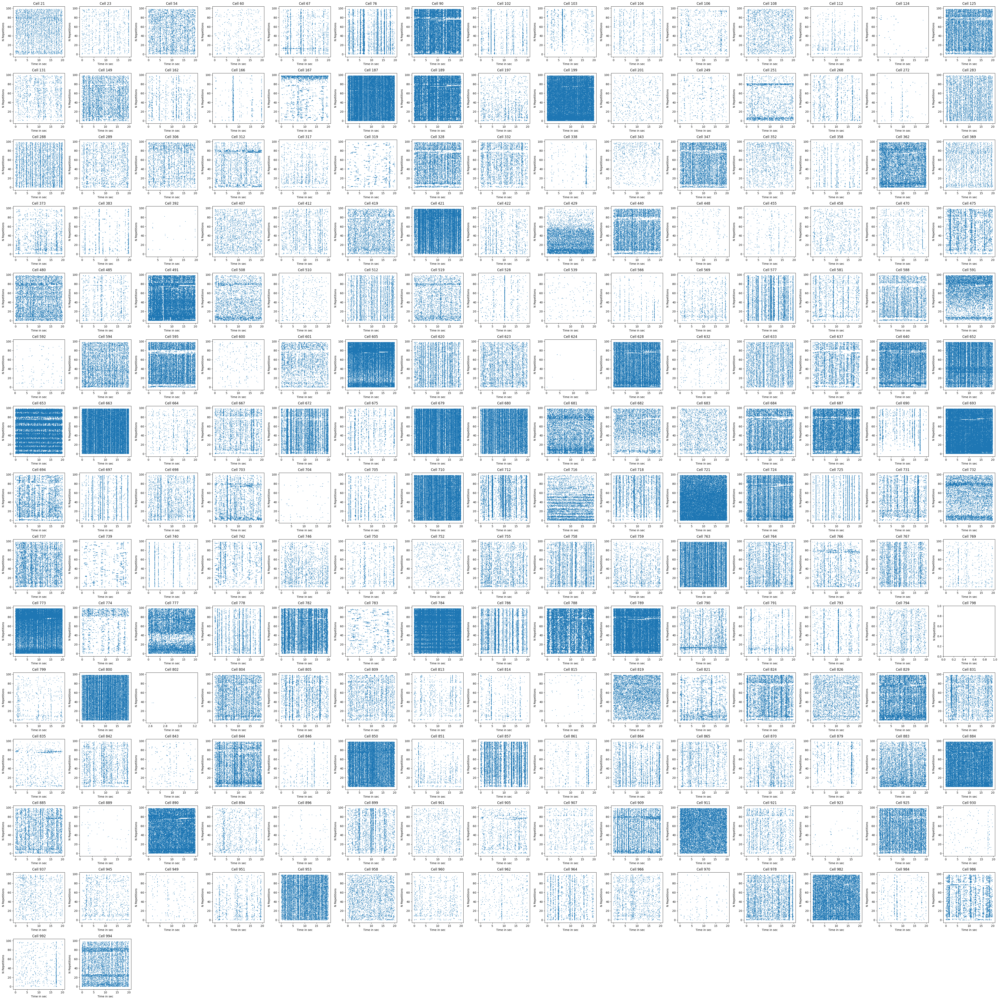

Saving rasters ...


  0%|          | 0/212 [00:00<?, ?it/s]

In [ ]:
"""
    Variables
    
    DO NOT CHANGE VALUES HERE UNLESS DEBUG/SPECIFIC USE
    
    All the variables used in this part of the cell should always refere to your 'params.py' file
    unless you want to manually change them only for this run (i.e. debugging). 
    You may have to add those variable into the function you want to adapt as only the minimal 
    amount of var are currently given to functions as inputs.
"""

# Length of each sequence composed of half repeated sequence and half random sequence
nb_frames_by_sequence = params.nb_frames_by_sequence



"""
    Input
"""
save_fig = True

ploting = True



"""
    Processing
"""

raster_data = {}
print('Building rasters...')
for (cell_id, spike_times) in tqdm(checkerboard_spikes.items()):

    # Get rasters on repeated sequence
    raster_data[cell_id] = extract_from_sequence(spike_times, triggers, nb_repeats, stim_frequency = stimulus_frequency)


# Plot all the rasters. Takes a few seconds.
if ploting :
    size = int(math.sqrt(len(cells_id)))+1

    fig, axs = plt.subplots(nrows = size, ncols=size, figsize = (50,50))
    print('Ploting...')
    for i in tqdm(range(size**2)):
        ax = axs[i//size,i%size]
        if i < len(cells_id):
            ax.eventplot(raster_data[cells_id[i]]["spike_trains"])
            ax.set(title = "Cell {}".format(cells_id[i]),xlabel='Time in sec', ylabel='N Repetitions')
        else : ax.set_visible(False)


    plt.tight_layout()
    plt.show(block=False)
    plt.close('all')


# Saving options creating a folder with all rasters, one file per cell.
if save_fig:
    print("Saving rasters ...")
    fig_directory = os.path.normpath(os.path.join(check_directory,r'Rasters_figs'))
    if not os.path.isdir(fig_directory): os.makedirs(fig_directory)
    
    for cell_nb in tqdm(cells_id):
        fig, axs = plt.subplots(nrows = 2,ncols = 1, sharex=True, gridspec_kw={'height_ratios': [3, 1]}, figsize=(10,10))

        plt.suptitle(f'Cell {cell_nb}')
        
        ax_rast = axs[0]
        ax_rast.eventplot(raster_data[cell_nb]["spike_trains"])
        ax_rast.set(title = "Raster plot", ylabel='N Repetitions')

        ax_psth = axs[1]
        width = (raster_data[cell_nb]["repeated_sequences_times"][0][0]/int(nb_frames_by_sequence/2))
        seq_lenght=raster_data[cell_nb]["repeated_sequences_times"][0][1]-raster_data[cell_nb]["repeated_sequences_times"][0][0]
        ax_psth.bar(np.linspace(0,seq_lenght,int(nb_frames_by_sequence/2))+width/2, raster_data[cell_nb]["psth"], width=1.3*width)
        ax_psth.set(xlabel='Time in sec', ylabel='Firing rate (spikes/s)')

        plt.subplots_adjust(wspace=0, hspace=0)
        fig_file = os.path.join(fig_directory,f'Cell_{cell_nb}.png')
        plt.savefig(fig_file, dpi=fig.dpi)
        plt.clf()
        plt.close()
    np.save(os.path.join(check_directory,'Check_rasters_data'), raster_data)


print('--- Cell Done ---')


### Cell 4 : Sanity check one cell at a time

Total : 276 neurons found 

Clusters id :
[10, 35, 36, 42, 48, 49, 50, 54, 55, 74, 75, 77, 78, 83, 90, 93, 96, 101, 110, 111, 112, 116, 117, 143, 144, 153, 154, 163, 167, 168, 171, 173, 174, 180, 186, 193, 214, 217, 221, 225, 226, 227, 229, 235, 246, 247, 258, 262, 263, 268, 282, 287, 302, 311, 336, 346, 348, 349, 350, 351, 354, 366, 377, 384, 387, 388, 392, 404, 411, 414, 422, 423, 431, 444, 457, 465, 466, 478, 480, 482, 486, 488, 493, 494, 496, 498, 519, 544, 556, 578, 580, 589, 595, 608, 612, 617, 618, 622, 624, 645, 647, 652, 662, 668, 674, 676, 688, 696, 698, 702, 714, 715, 719, 722, 729, 736, 738, 748, 775, 781, 782, 783, 789, 790, 793, 799, 807, 810, 819, 834, 836, 843, 846, 852, 863, 864, 871, 882, 886, 887, 888, 890, 891, 899, 900, 906, 918, 926, 934, 938, 939, 940, 943, 946, 950, 957, 958, 962, 966, 980, 988, 989, 993, 996, 997, 999, 1004, 1015, 1020, 1021, 1023, 1028, 1035, 1038, 1041, 1044, 1046, 1049, 1050, 1051, 1057, 1062, 1063, 1064, 1072, 1073, 1075, 1087, 1092, 1095, 

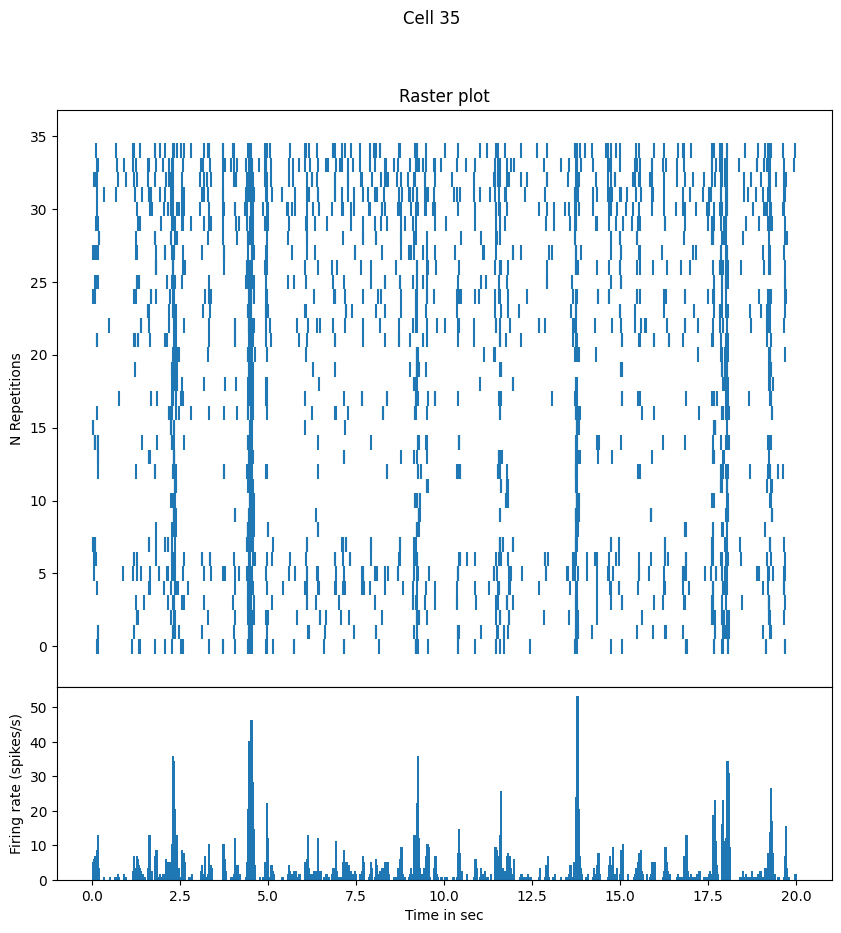

In [22]:
"""
    Input
"""
print('Total : {} neurons found \n\nClusters id :\n{}\n'.format(len(checkerboard_spikes.keys()),cells_id))

cell_nb = int(input("Wich cell to select : "))

"""
    Plotting
"""

#Plot all the rasters. Takes a few seconds.

fig, axs = plt.subplots(nrows = 2,ncols = 1, sharex=True, gridspec_kw={'height_ratios': [3, 1]}, figsize=(10,10))
ax_rast = axs[0]
ax_rast.eventplot(raster_data[cell_nb]["spike_trains"])
ax_rast.set(title = "Raster plot", ylabel='N Repetitions')

ax_psth = axs[1]
width = (raster_data[cell_nb]["repeated_sequences_times"][0][0]/int(nb_frames_by_sequence/2))
seq_lenght=raster_data[cell_nb]["repeated_sequences_times"][0][1]-raster_data[cell_nb]["repeated_sequences_times"][0][0]
ax_psth.bar(np.linspace(0,seq_lenght,int(nb_frames_by_sequence/2))+width/2, raster_data[cell_nb]["psth"], width=1.3*width)
ax_psth.set(xlabel='Time in sec', ylabel='Firing rate (spikes/s)')


plt.suptitle(f'Cell {cell_nb}')
plt.subplots_adjust(wspace=0, hspace=0)
plt.show(block=False)
plt.close(fig)

### Cell 5 : Compute STA

#### <center><i>REQUIRES CELL 1 RUN</center>

In [ ]:
"""
    Processing
"""

sta_data = {}
print('Building STAs...')

for (cell_id, spike_times) in tqdm(checkerboard_spikes.items()):
    
    # Get spikes on random sequences
    sta_data[cell_id]  = extract_from_sequence(spike_times, triggers, nb_repeats, stimulus_frequency, sequence_portion=(0,0.5))
    
    # Compute sta of the cell
    sta_3D             = compute_3D_sta(sta_data[cell_id], checkerboard, stimulus_frequency, cluster_id=cell_id) 
    
    # Adding data to the notebook dictionnary
    sta_data[cell_id]['sta_3D'] = sta_3D

    
    
"""
    Saving
"""

sta_data_file = os.path.normpath(os.path.join(check_directory, 'sta_data_3D.pkl'))
save_obj(sta_data,sta_data_file)
    

### If needed, check the single cell's 3D sta

In [ ]:
"""
    Input
"""

print('Total : {} neurons found \n\nClusters id :\n{}\n'.format(len(checkerboard_spikes.keys()),cells_id))
cell_id = int(input("Wich cell to select : "))



"""
    Plotting
"""

fig = plt.figure(figsize=(10,10))
gs = GridSpec(8, 5, figure=fig)
for i in range(40):
    ax = fig.add_subplot(gs[i//5,i%5])
    ax.imshow(sta_data[cell_id]['sta_3D'][i])
plt.show(block=False)
plt.close(fig)


### Cell 6 : Fitting ellipses

#### <center><i>REQUIRES CELL 1 RUN AND CELL 4 OUTPUT </center>

In [ ]:
"""
    Processing
"""

# File loading the 3D sta dictionnary saved above in this notebook
sta_data_file = os.path.normpath(os.path.join(check_directory, 'sta_data_3D.pkl'))
sta_data = load_obj(sta_data_file)

for cell_id in tqdm(sta_data):
    sta_3D = sta_data[cell_id]['sta_3D']
    
    if np.max(np.abs(sta_3D)) == 0:
        print(f'No ellipse fit on cell {cell_id}')
        sta_data[cell_id]["center_analyse"]   = {'Spatial':np.zeros(checkerboard[0].shape), 'Temporal':np.zeros(checkerboard.shape[0]), 'EllipseCoor':np.asarray([0, 0, 0, 0.001, 0.001, 0]), 'Cell_delay':np.nan}
        sta_data[cell_id]["surround_analyse"] = {'Spatial':np.zeros(checkerboard[0].shape), 'Temporal':np.zeros(checkerboard.shape[0]), 'EllipseCoor':np.asarray([0, 0, 0, 0.001, 0.001, 0]), 'Cell_delay':np.nan}
        sta_data[cell_id]["analyse_sta"]      = {'Spatial':np.zeros(checkerboard[0].shape), 'Temporal':np.zeros(checkerboard.shape[0]), 'EllipseCoor':np.asarray([0, 0, 0, 0.001, 0.001, 0]), 'Cell_delay':np.nan}

        continue
    
    # Perform the fitting for the current cell using one of the bellow method (default "analyse_sta_matias")
    sta_data[cell_id]["center_analyse"]   = analyse_sta_tom(sta_3D, cell_id) #New fitting of ellipse, more performant
#     sta_data[cell_id]["center_analyse"]   = analyse_sta_matias(sta_3D, cell_id)
#     sta_data[cell_id]["surround_analyse"] = analyse_sta_gab(sta_3D, cell_id)
#     sta_data[cell_id]["analyse_sta"]      = analyse_sta(sta_3D, cell_id)

"""
    Saving
"""

#File where all fitted data are saved
fitted_file = os.path.normpath(os.path.join(check_directory,'sta_data_3D_fitted.pkl'))
save_obj(sta_data, fitted_file)
    
print('--Fitting Done--')

# Plotting STAs and their fitted ellipses

  0%|          | 0/212 [00:00<?, ?it/s]

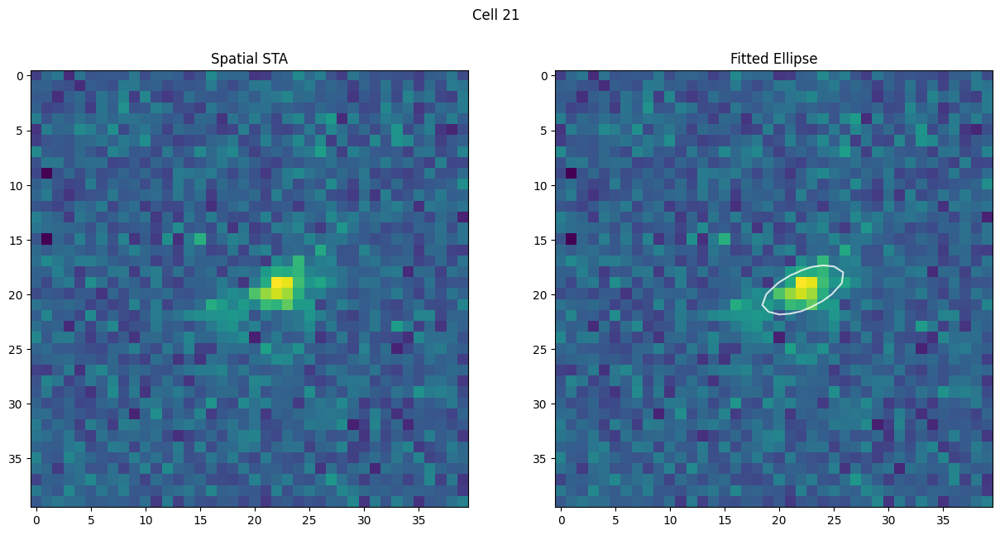

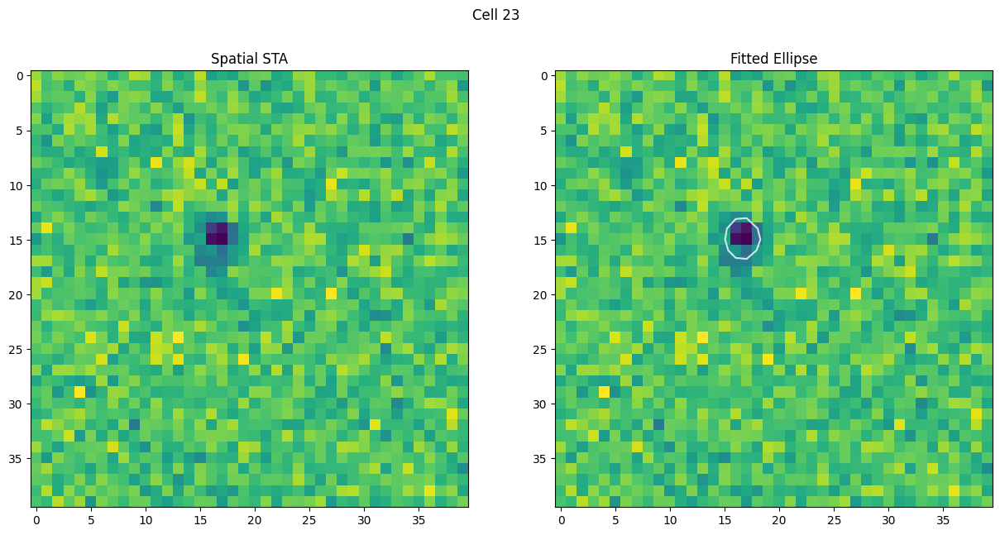

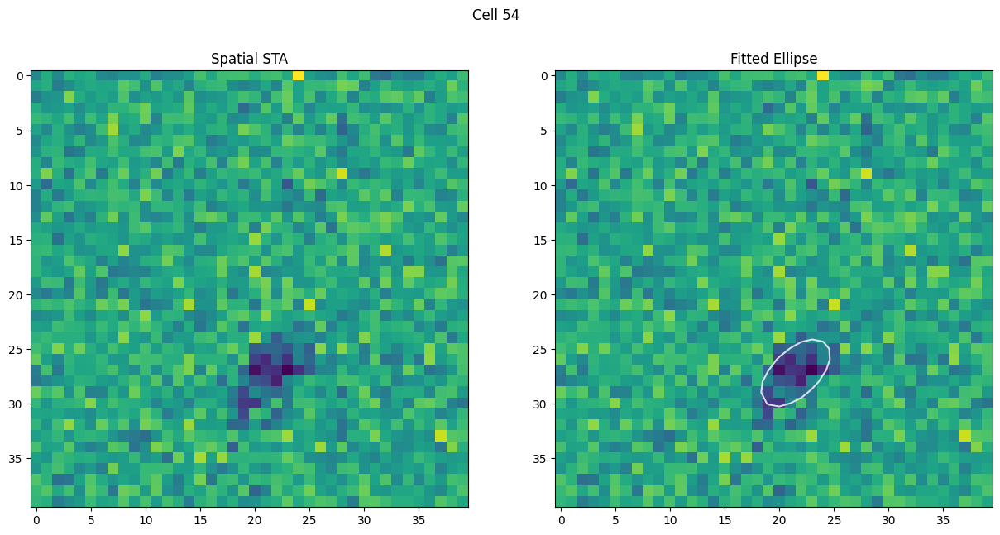

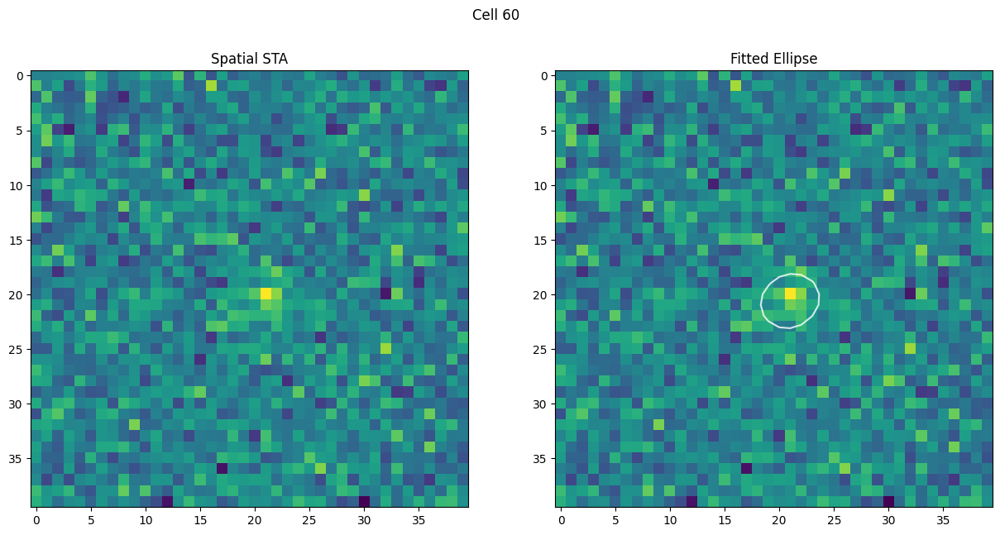

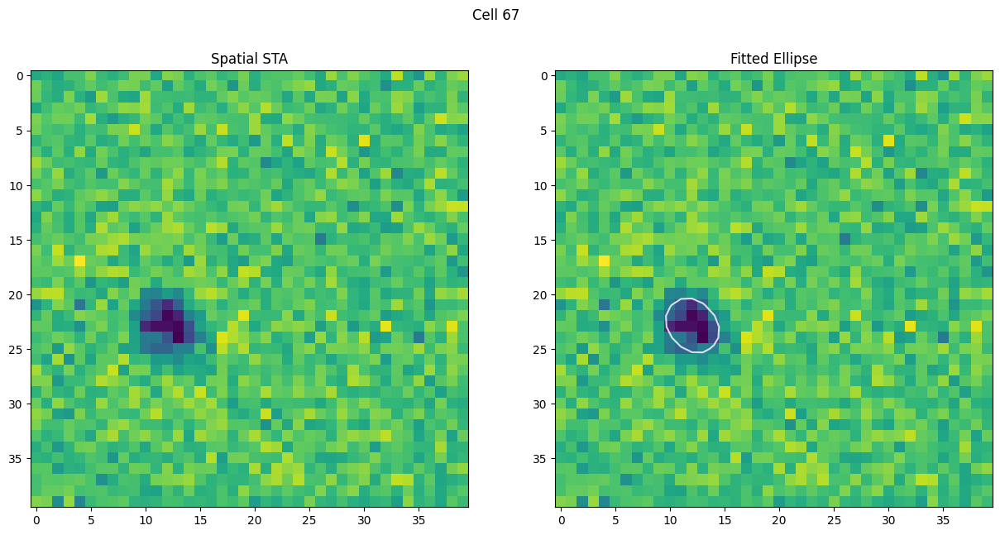

...

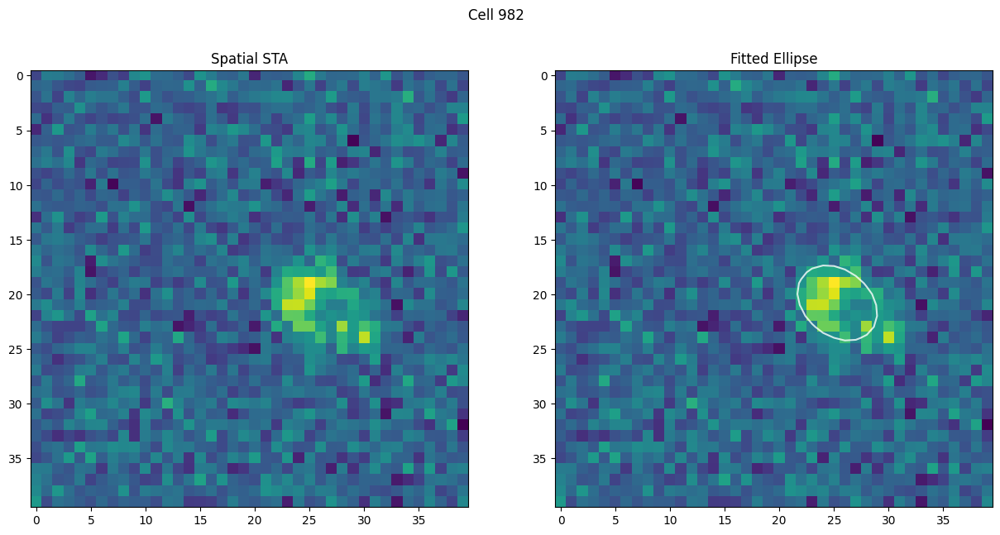

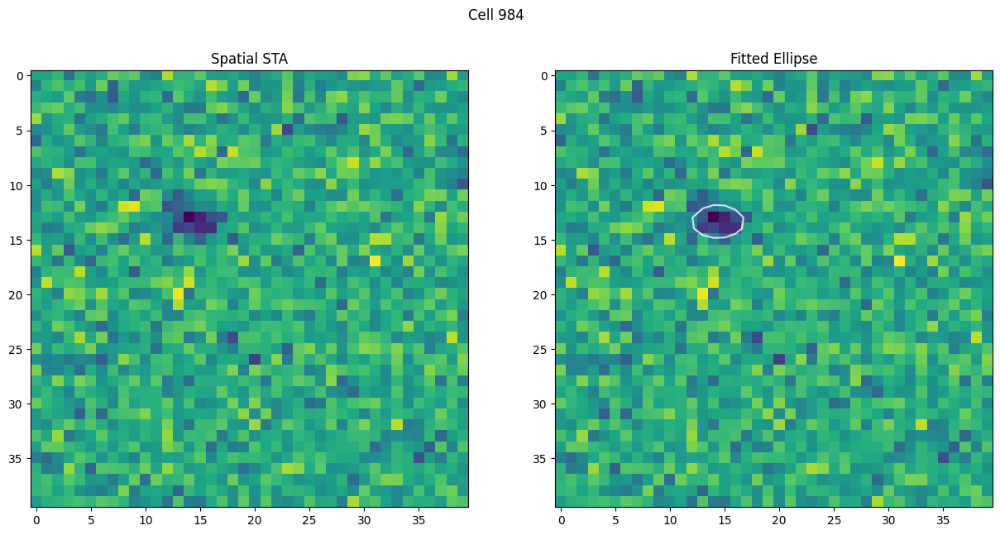

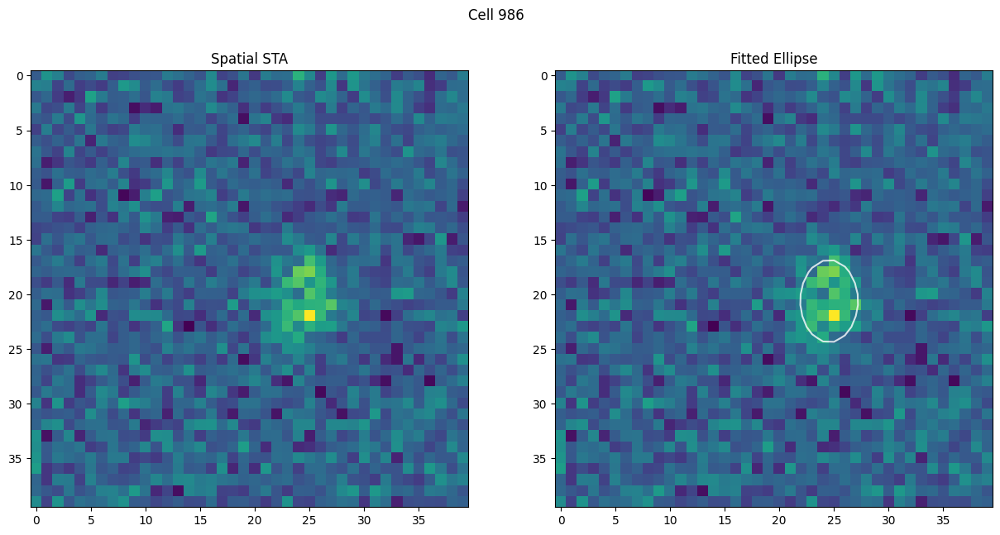

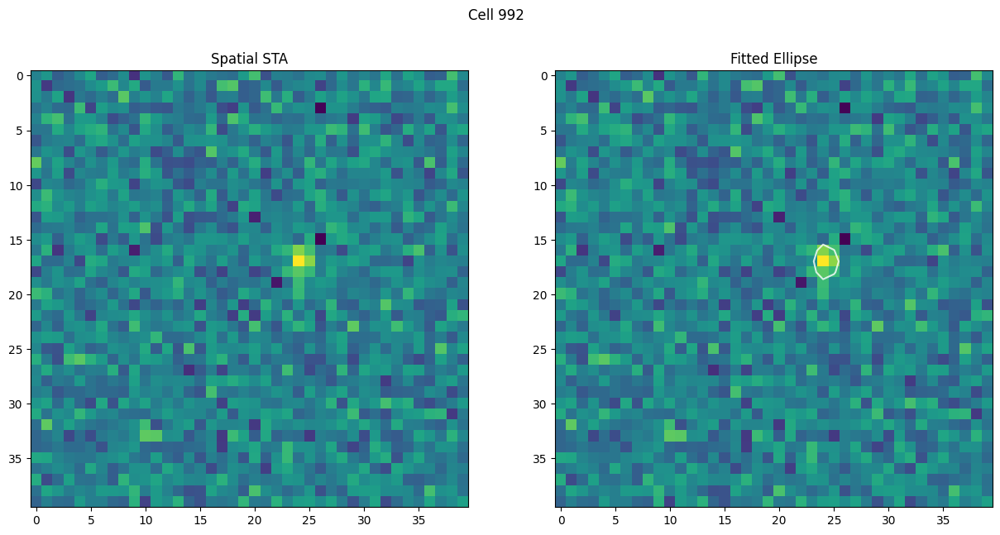

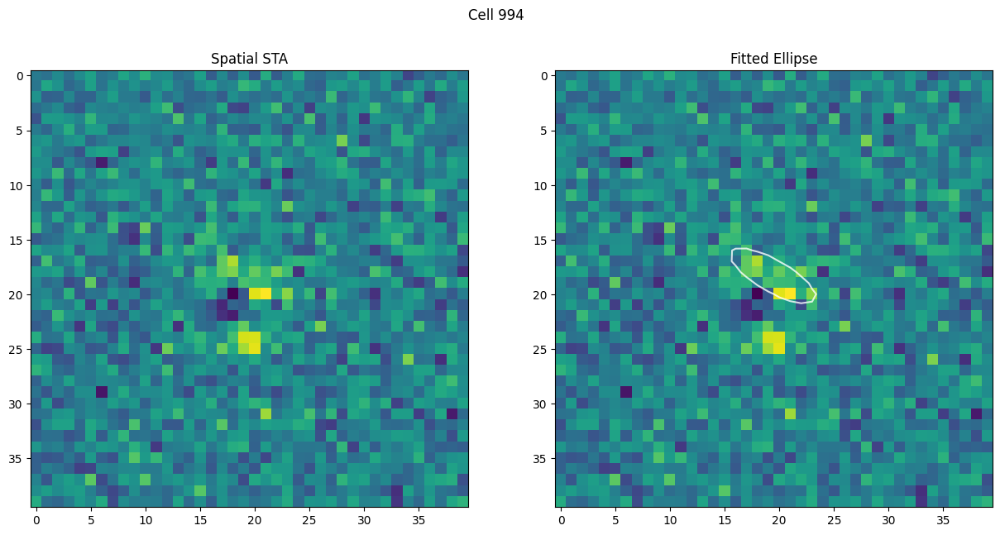

In [6]:
"""
    Plotting
"""

#Folder where figure will be saved
fig_directory = os.path.normpath(os.path.join(check_directory,r'Stas_figs'))
if not os.path.isdir(fig_directory): os.makedirs(fig_directory)

sta_data=np.load(os.path.join(check_directory,'sta_data_3D_fitted.pkl'),allow_pickle=True)

for cell_id in tqdm(cells_id[0:]):
    fig, axs = plt.subplots(nrows = 1,ncols = 2, figsize=(15,7))

    plt.suptitle(f'Cell {cell_id}')
    sta=sta_data[cell_id]["center_analyse"]
    ax = axs[0]
    ax.imshow(sta['Spatial'])
    ax.set(title = "Spatial STA")

    ax = axs[1]
    ax.set(title = "Fitted Ellipse")

    try:
        ax = plot_sta(ax, sta['Spatial'],sta['EllipseCoor'])
    except:
        ax.imshow(sta_data[cell_id]["center_analyse"]['Spatial'])

    fig_file = os.path.join(fig_directory,f'Cell_{cell_id}.png')
    plt.savefig(fig_file, dpi=fig.dpi)
    plt.show()
    plt.clf()
    plt.close()

# Plotting STAs and their fitted ellipses (New proposition by Tom)

In [ ]:
"""
    Plotting
"""

#Folder where figure will be saved
fig_directory = os.path.normpath(os.path.join(check_directory,r'Stas_figs'))
if not os.path.isdir(fig_directory): os.makedirs(fig_directory)

sta_data=np.load(os.path.join(check_directory,'sta_data_3D_fitted.pkl'),allow_pickle=True)

for cell_id in tqdm(cells_id[0:]):
    fig, axs = plt.subplots(nrows = 1,ncols = 3, figsize=(30,10))

    plt.suptitle(f'Cell {cell_id}')
    sta=sta_data[cell_id]["center_analyse"]
    ax = axs[0]
    ax.eventplot(raster_data[cell_id]["spike_trains"])
    ax.set(title = "Raster plot", ylabel='N Repetitions')

    ax = axs[1]
    ax.set(title = "Fitted Ellipse")

    try:
        ax = plot_sta_tom(ax, sta['Spatial'],sta['EllipseCoor'])
    except: 
        ax.imshow(sta_data[cell_id]["center_analyse"]['Spatial'])

    ax=axs[2]
    ax.set(title = "Temporal STA")
    ax.plot(sta['Temporal'])
    ax.set_ylim([-1,1])

    fig_file = os.path.join(fig_directory,f'Cell_{cell_id}.png')
    plt.savefig(fig_file, dpi=fig.dpi)
    plt.show()
    plt.clf()
    plt.close()

# Quantification of the number of STAs (not needed in the standard pipeline)

In [2]:
#The Goal of this cell is to quantify the number of STAs in your data
#Tuned to a 40x40 with square of 15 pixels checkerboard.
#Maybe, you need to tune it for your specific checkerboard
#See with Tom Quetu if needed for the tuning

print('')
nb_of_pixels_by_check = int(input("Select number of pixels by checks : ")) 

sta_data=np.load(os.path.join(check_directory,'sta_data_3D_fitted.pkl'),allow_pickle=True)
sta_quantification_dict={}

for cell in tqdm(cells_id[0:]):
    fig, ax = plt.subplots(nrows = 1,ncols = 1, figsize=(7,7))

    plt.suptitle(f'Cell {cell}')
    
    sta_spatial=sta_data[cell]["center_analyse"]['Spatial']
    ellipse_coor=sta_data[cell]["center_analyse"]['EllipseCoor']

    sta_quantification=check_presence_STA(sta_spatial,ellipse_coor,nb_of_pixels_by_check,tresh_snr=2.75)

    try:
        ax = plot_sta_tom(ax, sta_spatial,ellipse_coor)
    except: 
        ax.imshow(sta_spatial)

    color_cadr='r'
    if sta_quantification[0]==1:
        color_cadr='g'
        ax.set(title='STA with a SNR of ' + str(sta_quantification[1]))
    elif sta_quantification[0]==0.1:
        ax.set(title='ellipse not centered')
    elif sta_quantification[0]==0.2:
        ax.set(title='no ellipse fitted')
    elif sta_quantification[0]==0.3:
        ax.set(title='diameter too big or too small, diameter: ' + str(sta_quantification[1]) +'µm')
    elif sta_quantification[0]==0.4:
        ax.set(title='No STA because the SNR is too small, SNR:' + str(sta_quantification[1]))

    ax.spines['top'].set(lw=6, color=color_cadr)
    ax.spines['bottom'].set(lw=6, color=color_cadr)
    ax.spines['left'].set(lw=6, color=color_cadr)
    ax.spines['right'].set(lw=6, color=color_cadr)

    sta_quantification_dict[cell]=sta_quantification[0]
    plt.show()
    plt.close()

sta_quantif_dir=check_directory+'/sta_quantification'
save_obj(sta_quantification_dict,sta_quantif_dir)

NameError: name 'np' is not defined

# --------- end of the notebook---------------------------------------

# -----------work in progress---------------

### Cell 7 : Compare fits - Spatial STA

In [ ]:
"""
    Variable
    
    You will find here all variables used in this notebook cell. They should always refere to your 'params.py' file
    except if you want to manually change some variable only for this run (i.e. debugging). You may have to add those
    variable into the function you want to adapt as only the minimal amount of var are currently given to functions as inputs.
"""

output_directory = params.output_directory

"""
    Input
"""
# path = 'E:\Exp_17_for benchmark\RF_m1'


fitted_file = os.path.normpath(os.path.join(output_directory,'sta_data_3D_fitted.pkl'))

"""
    Processing
"""

sta_data = load_obj(fitted_file)

for cell_id in sta_data.keys():
    fig = plt.figure(figsize=(12,3))
    plt.subplots_adjust()
    fig.suptitle(f'Cell : {cell_id}')
    gs = GridSpec(1, 4, figure=fig)
    
#     png_image = np.array(Image.open(os.path.normpath(os.path.join(path,r'exp17_m1_clus{}_RF_STA_check.png'.format(cell_id)))))[74:472,132:530].transpose(1,0,2)
    matias  = sta_data[cell_id]["center_analyse"]  
#     gabriel = sta_data[cell_id]["surround_analyse"]
    mixed   = sta_data[cell_id]["analyse_sta"]
    
    try:
#         ax1 = fig.add_subplot(gs[0,0])
#         ax1.imshow(png_image)
#         ax1.set_title('Matlab')
        
        ax2 = fig.add_subplot(gs[0,1])
        ax2 = plot_sta(ax2, matias['Spatial'],matias['EllipseCoor'])       
        ax2.set_title('Matias')

#         ax3 = fig.add_subplot(gs[0,2])
#         ax3 = plot_sta(ax3, matias['Spatial'],gabriel['EllipseCoor'])    
#         ax3.set_title('Gabriel')
        
        ax4 = fig.add_subplot(gs[0,3])
        ax4 = plot_sta(ax4, mixed['Spatial'],mixed['EllipseCoor'])    
        ax4.set_title('Mixed')
        
        
    except:
        print(f'No print for cell {cell_id}')
        pass
    m=matias['EllipseCoor']
#     g=gabriel['EllipseCoor']
    mixed = mixed['EllipseCoor']
    print(f'matias : {m}')
#     print(f'gabriel : {g}')
    print(f'mixed : {mixed}')
    plt.show(block=False)

    print('--- Ploting Done ---')

In [ ]:
cell_id = 30

png_image = np.asarray(Image.open(os.path.normpath(os.path.join(path,r'exp17_m1_clus{}_RF_STA_check.png'.format(cell_id)))))[74:472,132:530].transpose(1,0,2)
matias  = sta_data[cell_id]["center_analyse"]  
gabriel = sta_data[cell_id]["surround_analyse"]
mixed   = sta_data[cell_id]["analyse_sta"]

fig = plt.figure(constrained_layout=True, figsize=(12,3))
gs = GridSpec(1, 4, figure=fig, wspace = 0)

ax1 = fig.add_subplot(gs[0,0])
ax1.imshow(png_image)
ax1.set_title('Matlab')

ax2 = fig.add_subplot(gs[0,1])
ax2 = plot_sta(ax2, matias['Spatial'],matias['EllipseCoor'])       
ax2.set_title('Matias')

ax3 = fig.add_subplot(gs[0,2])
ax3 = plot_sta(ax3, gabriel['Spatial'],gabriel['EllipseCoor'])    
ax3.set_title('Gabriel')

ax4 = fig.add_subplot(gs[0,3])
ax4 = plot_sta(ax4, mixed['Spatial'],mixed['EllipseCoor'])    
ax4.set_title('Mixed')

m=matias['EllipseCoor']
g=gabriel['EllipseCoor']
mixed = mixed['EllipseCoor']

print(f'matias : {m}')
print(f'gabriel : {g}')
print(f'mixed : {mixed}')

plt.show(block=False)

### Cell 8 : Compare fit - Temporal STA

In [ ]:
"""
    Variable
    
    You will find here all variables used in this notebook cell. They should always refere to your 'params.py' file
    except if you want to manually change some variable only for this run (i.e. debugging). You may have to add those
    variable into the function you want to adapt as only the minimal amount of var are currently given to functions as inputs.
"""

output_directory = params.output_directory

"""
    Input
"""

# path = 'E:\Exp_17_for benchmark\RF_m1'
fitted_file = os.path.normpath(os.path.join(output_directory,'sta_data_3D_fitted.pkl'))

"""
    Processing
"""

sta_data = load_obj(fitted_file)

for cell_id in sta_data.keys():
    
    fig = plt.figure(figsize=(9,3))
    plt.subplots_adjust()
    fig.suptitle(f'Cell : {cell_id}')
    gs = GridSpec(1, 3, figure=fig)
    
    matias  = sta_data[cell_id]["center_analyse"]  
#     gabriel = sta_data[cell_id]["surround_analyse"]
    mixed   = sta_data[cell_id]["analyse_sta"]
    
    try:        
        ax1 = fig.add_subplot(gs[0,0])
        ax1.plot(matias['Temporal'])
        ax1.axvline(matias['Cell_delay'])
        ax1.set_title('Matias')

#         ax2 = fig.add_subplot(gs[0,1])
#         ax2.plot(gabriel['Temporal'])  
#         ax2.axvline(gabriel['Cell_delay'])
#         ax2.set_title('Gabriel')
        
        ax3 = fig.add_subplot(gs[0,2])
        ax3.plot(mixed['Temporal'])
        ax3.axvline(mixed['Cell_delay'])
        ax3.set_title('Mixed')
        
        
    except:
        print(f'Print failed for cell {cell_id}')
        pass
    
    m=matias['EllipseCoor']
#     g=gabriel['EllipseCoor']
    mixed = mixed['EllipseCoor']
    
    print(f'matias : {m}')
#     print(f'gabriel : {g}')
    print(f'mixed : {mixed}')
    plt.show(block=False)
